This code is used to check the low decoding accuuracy within subject in the IA_IAPS single trial betas.

In [3]:
import os
import sys
import numpy as np
import pandas as pd
import nibabel as nib
import nilearn
from nilearn.image import resample_img
from nilearn import plotting
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from nilearn import masking
from natsort import natsorted

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold, train_test_split
import matplotlib.pyplot as plt
from scipy.stats import zscore

from nilearn.image import new_img_like

In [4]:
maskDir = 'F:\yujun\projects\data\masks'
maskFile = os.path.join(maskDir, 'MNI152_T1_2mm_brain_mask.nii.gz')
mask = nib.load(maskFile)
temp_nii_path = r'F:\yujun\projects\AI_IAPS\GLM_singletrial\\betas\Sub1\\beta_0001.nii'
temp_nii_data = nib.load(temp_nii_path)
# Resample the MNI mask to match the dimensions and voxel size of your NIfTI file
resampled_mask = resample_img(mask, target_affine=temp_nii_data.affine, target_shape=temp_nii_data.shape)

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_stat_map.py:219: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  bg_img = load_mni152_template()
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:274: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



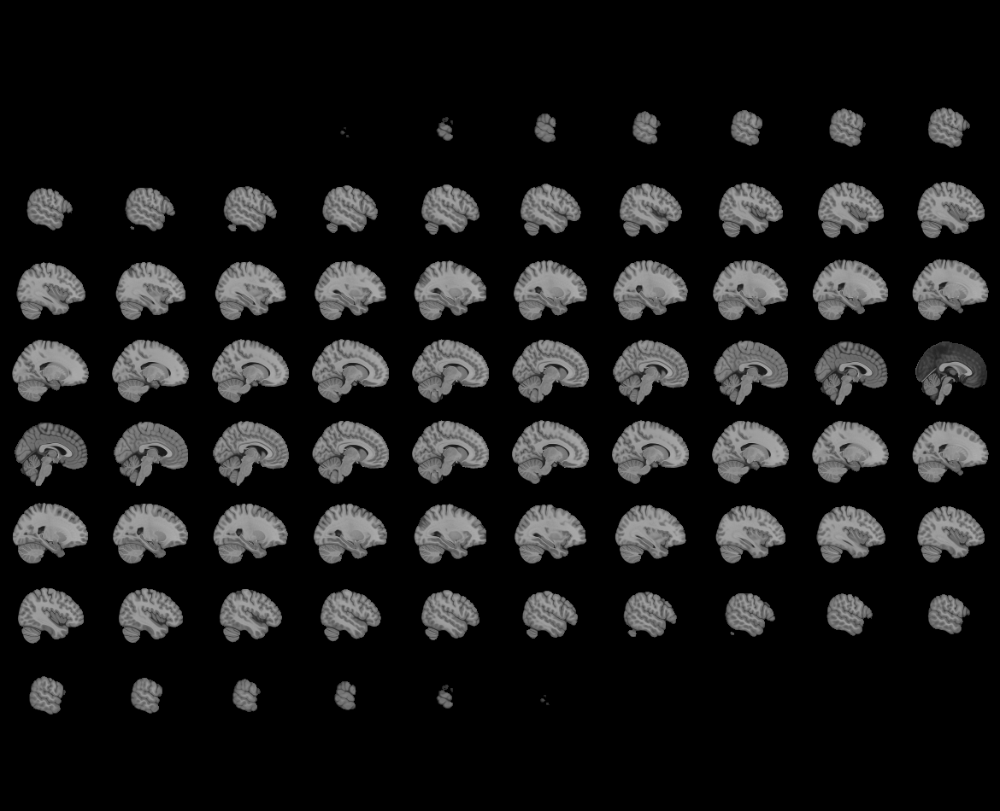
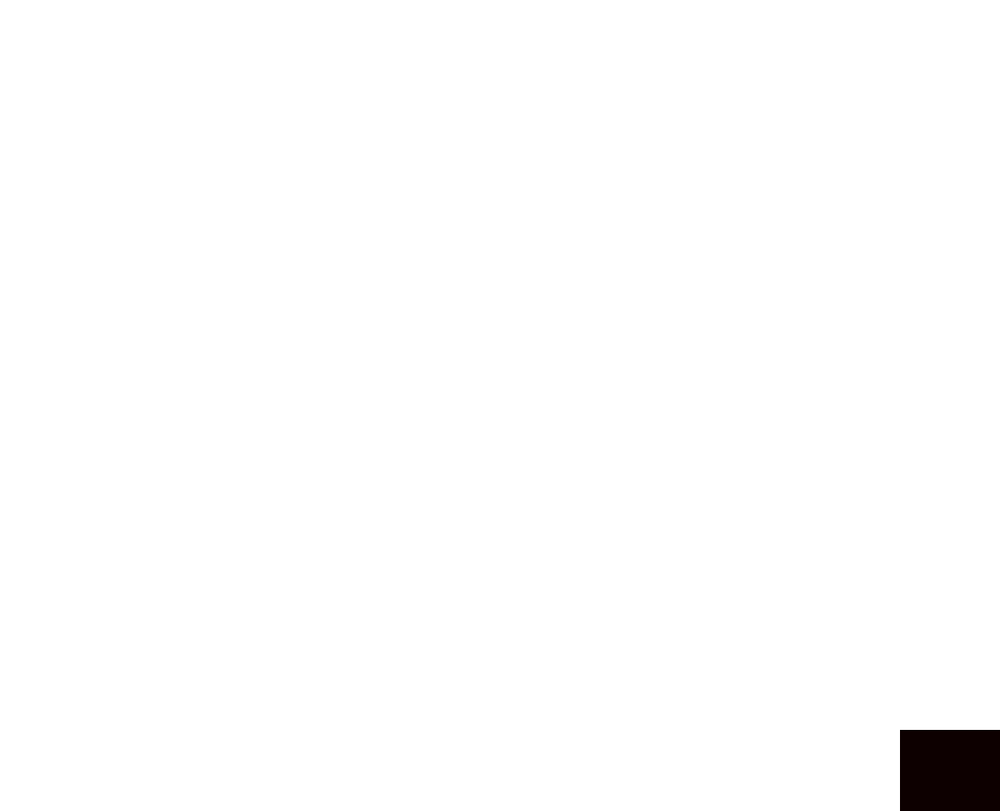

In [3]:


view = plotting.view_img(resampled_mask)
view

In [5]:
dir = "F:\yujun\projects\AI_IAPS\GLM_singletrial\\betas\Sub7"
beta_filenames = os.listdir(dir)[:70]
beta_filenames

['beta_0001.nii',
 'beta_0002.nii',
 'beta_0003.nii',
 'beta_0004.nii',
 'beta_0005.nii',
 'beta_0006.nii',
 'beta_0007.nii',
 'beta_0008.nii',
 'beta_0009.nii',
 'beta_0010.nii',
 'beta_0011.nii',
 'beta_0012.nii',
 'beta_0013.nii',
 'beta_0014.nii',
 'beta_0015.nii',
 'beta_0016.nii',
 'beta_0017.nii',
 'beta_0018.nii',
 'beta_0019.nii',
 'beta_0020.nii',
 'beta_0021.nii',
 'beta_0022.nii',
 'beta_0023.nii',
 'beta_0024.nii',
 'beta_0025.nii',
 'beta_0026.nii',
 'beta_0027.nii',
 'beta_0028.nii',
 'beta_0029.nii',
 'beta_0030.nii',
 'beta_0031.nii',
 'beta_0032.nii',
 'beta_0033.nii',
 'beta_0034.nii',
 'beta_0035.nii',
 'beta_0036.nii',
 'beta_0037.nii',
 'beta_0038.nii',
 'beta_0039.nii',
 'beta_0040.nii',
 'beta_0041.nii',
 'beta_0042.nii',
 'beta_0043.nii',
 'beta_0044.nii',
 'beta_0045.nii',
 'beta_0046.nii',
 'beta_0047.nii',
 'beta_0048.nii',
 'beta_0049.nii',
 'beta_0050.nii',
 'beta_0051.nii',
 'beta_0052.nii',
 'beta_0053.nii',
 'beta_0054.nii',
 'beta_0055.nii',
 'beta_005

# Plot single trial betas

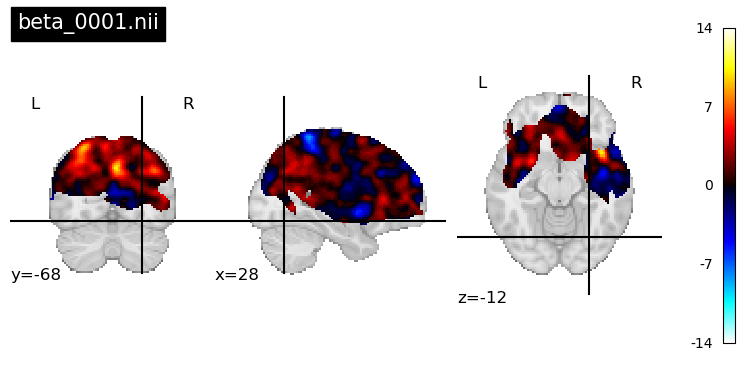

In [7]:
dir = "F:\yujun\projects\AI_IAPS\GLM_singletrial\\betas\Sub8"
beta_filenames = os.listdir(dir)[:1]
beta_filenames

for i in range(len(beta_filenames)):

    file_path = os.path.join(dir, f"{beta_filenames[i]}")
    nii_data= nib.load(file_path)
    # Apply the mask to the NIfTI image
    masked_data = masking.apply_mask(nii_data, resampled_mask)
    # Get the mask's indices in the original 3D shape
    mask_indices = np.where(resampled_mask.get_fdata())
    # Create a new 3D array filled with zeros
    reshaped_data = np.zeros(nii_data.shape)
    # Fill the new 3D array with the values from the masked data
    reshaped_data[mask_indices] = masked_data
    beta_nii = new_img_like(nii_data, reshaped_data)
    plotting.plot_stat_map(beta_nii, title = f"{beta_filenames[i]}", display_mode='ortho',cut_coords = [28, -68,-12])

plotting.show()

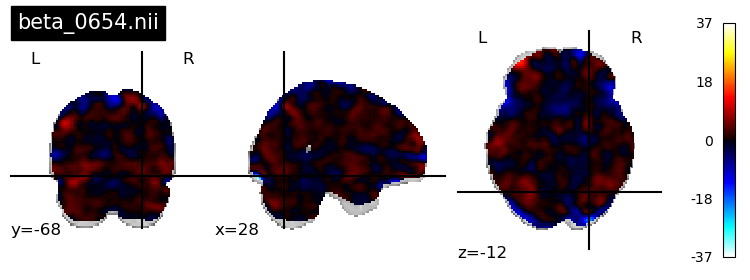

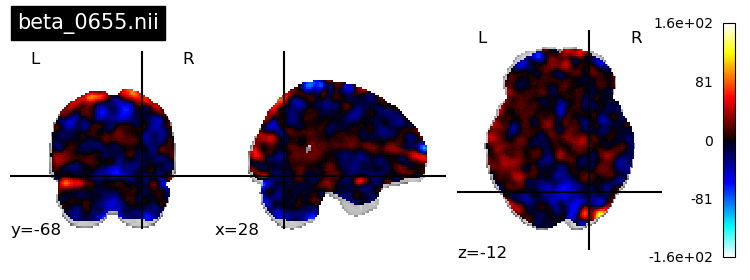

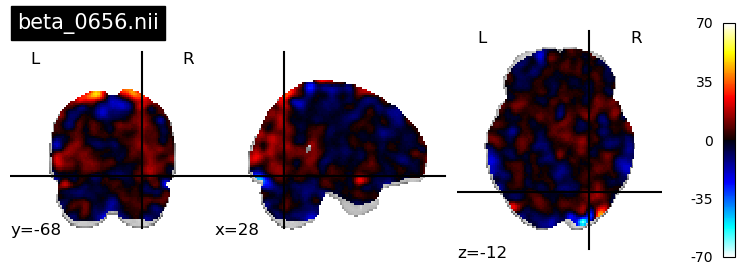

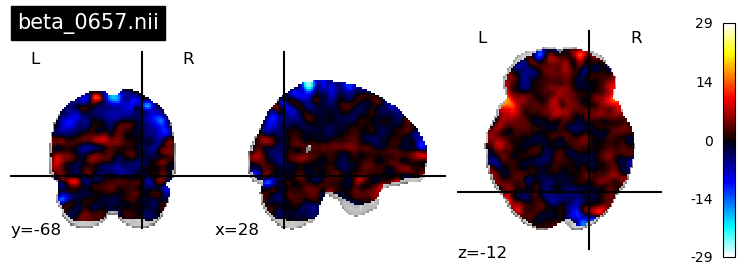

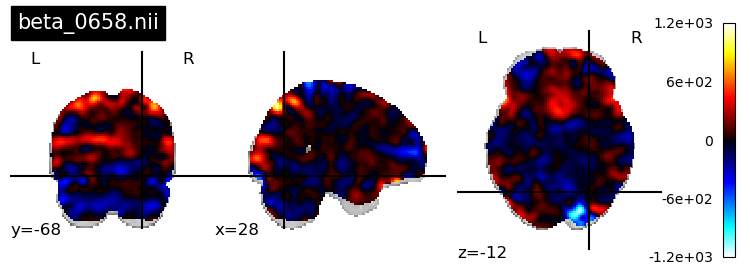

...

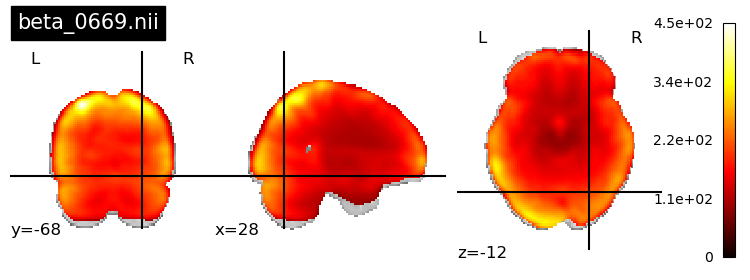

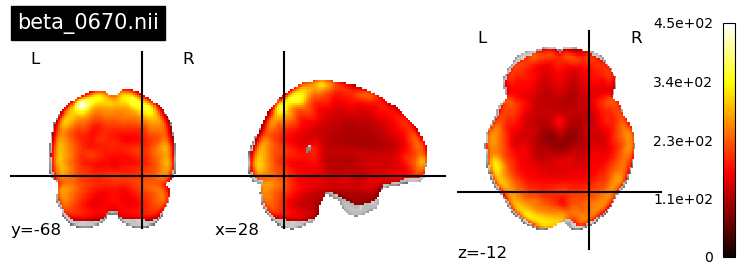

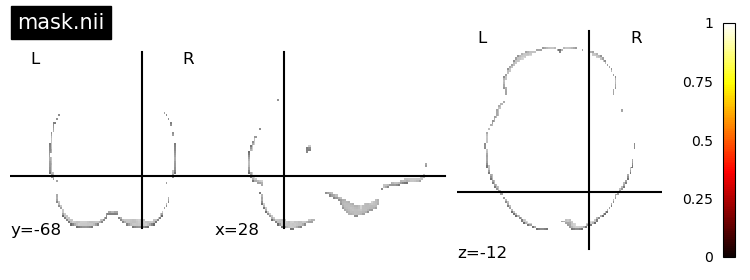

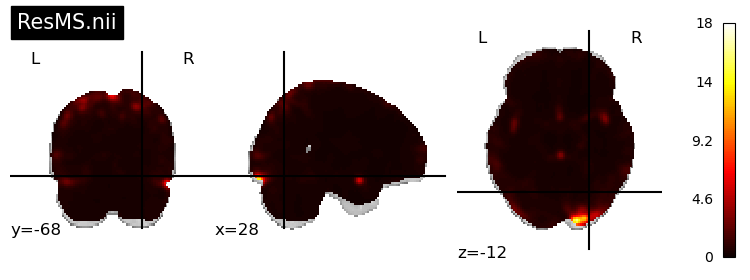

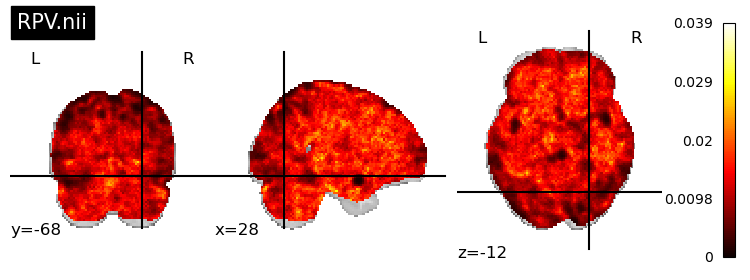

In [38]:
dir = "F:\yujun\projects\AI_IAPS\GLM_singletrial\\betas\Sub7"
beta_filenames = [filename for filename in os.listdir(dir) if filename.endswith('.nii')][-20:]

for i in range(len(beta_filenames)):

    file_path = os.path.join(dir, f"{beta_filenames[i]}")
    nii_data= nib.load(file_path)
    # Apply the mask to the NIfTI image
    masked_data = masking.apply_mask(nii_data, resampled_mask)
    # Get the mask's indices in the original 3D shape
    mask_indices = np.where(resampled_mask.get_fdata())
    # Create a new 3D array filled with zeros
    reshaped_data = np.zeros(nii_data.shape)
    # Fill the new 3D array with the values from the masked data
    reshaped_data[mask_indices] = masked_data
    beta_nii = new_img_like(nii_data, reshaped_data)
    plotting.plot_stat_map(beta_nii, title = f"{beta_filenames[i]}", display_mode='ortho',cut_coords = [28, -68,-12])

plotting.show()

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\displays\_slicers.py:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = plt.figure(figure, figsize=figsize,


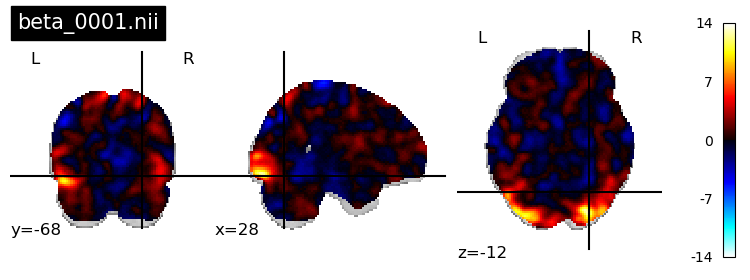

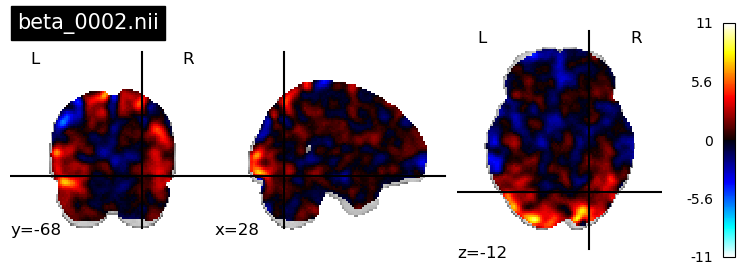

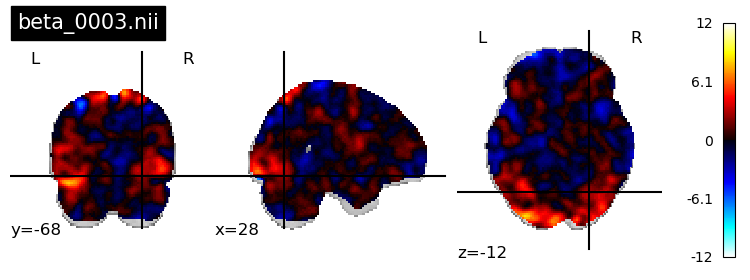

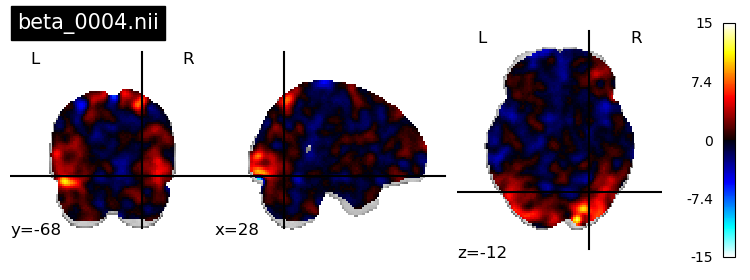

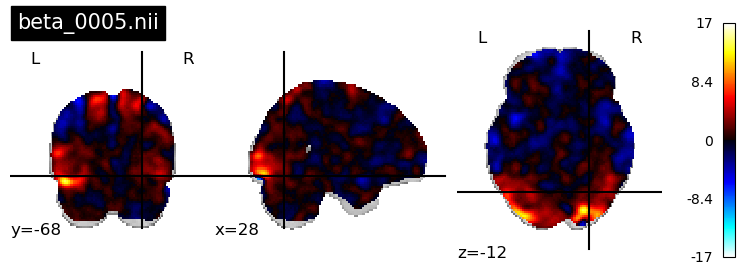

...

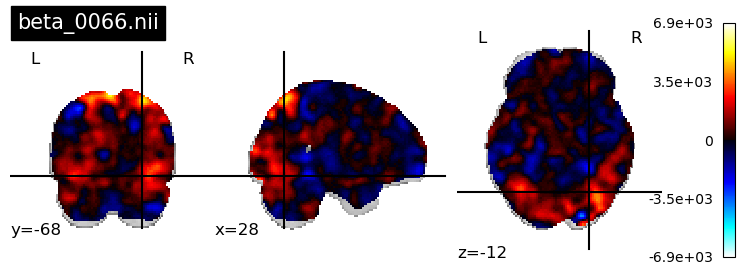

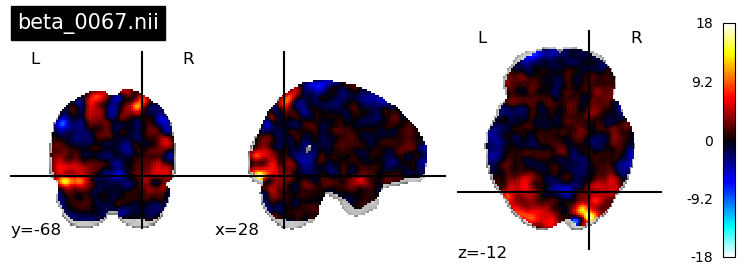

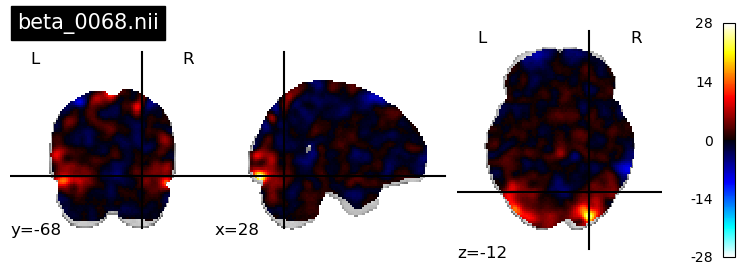

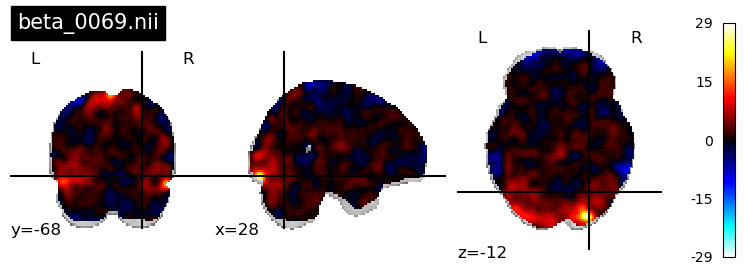

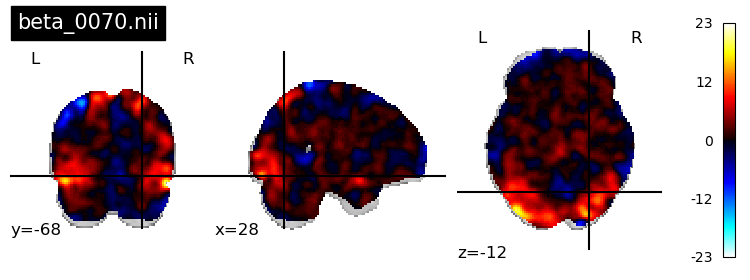

In [6]:

dir = "F:\yujun\projects\AI_IAPS\GLM_singletrial\\betas\Sub7_2207_longtrialnames"
beta_filenames = os.listdir(dir)[:70]
beta_filenames

for i in range(len(beta_filenames)):

    file_path = os.path.join(dir, f"{beta_filenames[i]}")
    nii_data= nib.load(file_path)
    # Apply the mask to the NIfTI image
    masked_data = masking.apply_mask(nii_data, resampled_mask)
    # Get the mask's indices in the original 3D shape
    mask_indices = np.where(resampled_mask.get_fdata())
    # Create a new 3D array filled with zeros
    reshaped_data = np.zeros(nii_data.shape)
    # Fill the new 3D array with the values from the masked data
    reshaped_data[mask_indices] = masked_data
    beta_nii = new_img_like(nii_data, reshaped_data)
    plotting.plot_stat_map(beta_nii, title = f"{beta_filenames[i]}", display_mode='ortho',cut_coords = [28, -68,-12])

plotting.show()

# Compare selected betas

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



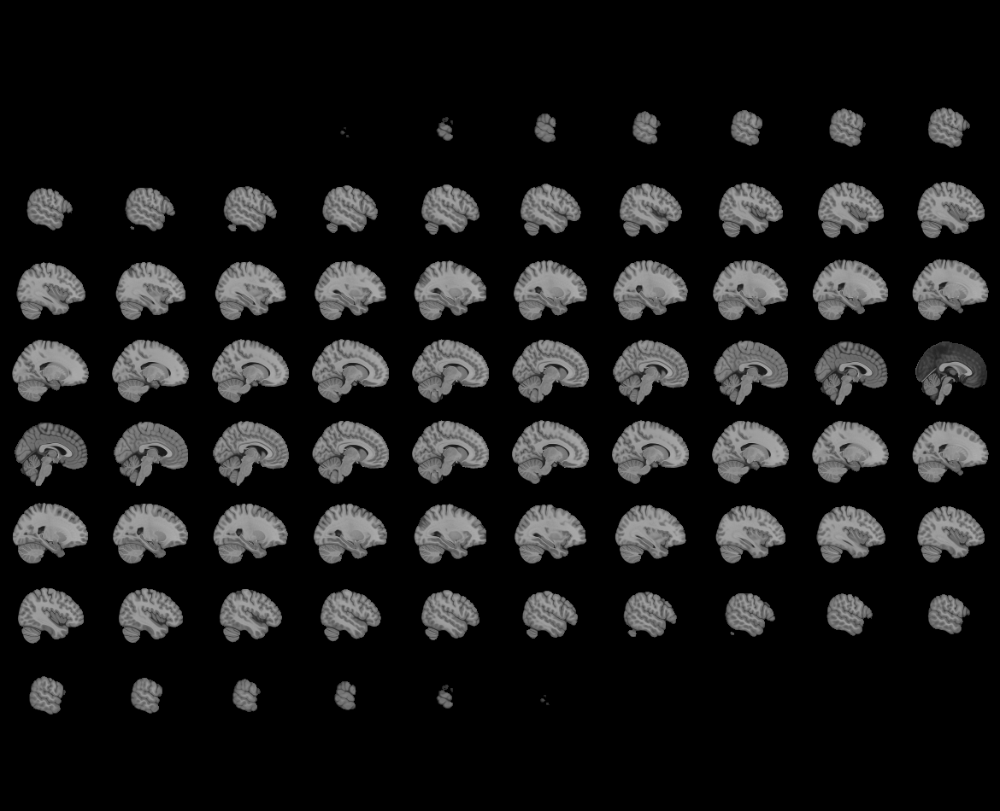
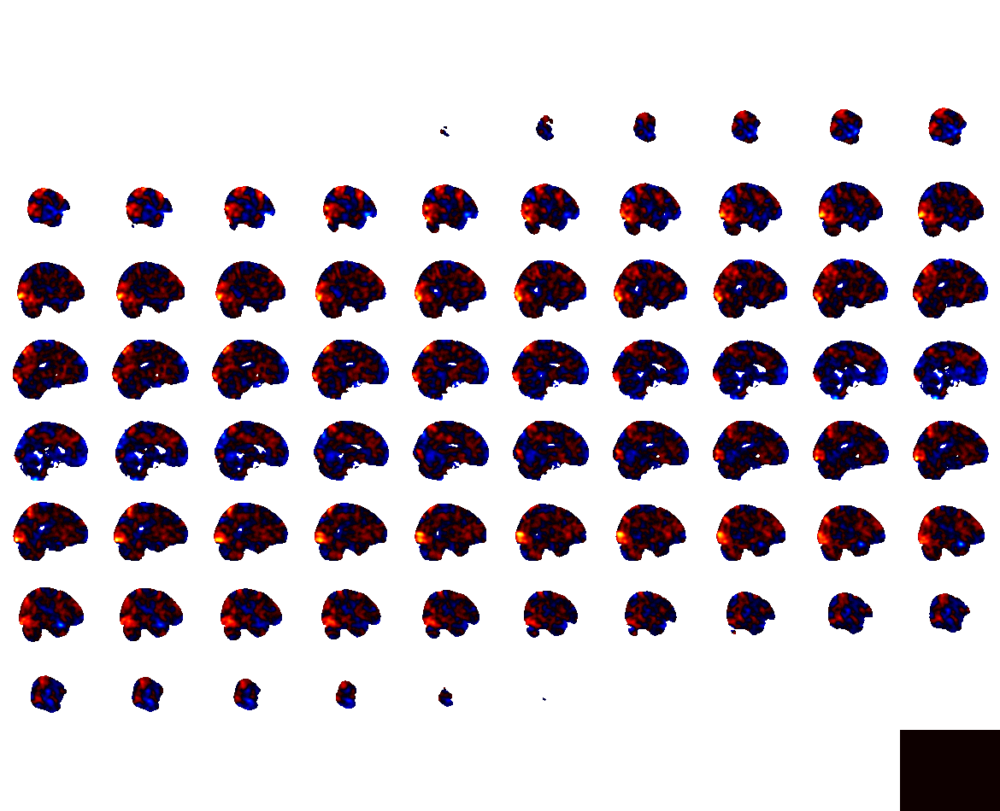

In [9]:
dir = "F:\yujun\projects\AI_IAPS\GLM_singletrial\\betas\Sub7"
beta_filenames = os.listdir(dir)[0]
beta_filenames
file_path = os.path.join(dir, f"{beta_filenames}")
nii_data= nib.load(file_path)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(nii_data, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(nii_data.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{beta_filenames}", display_mode='ortho',cut_coords = [28, -68,-12])
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



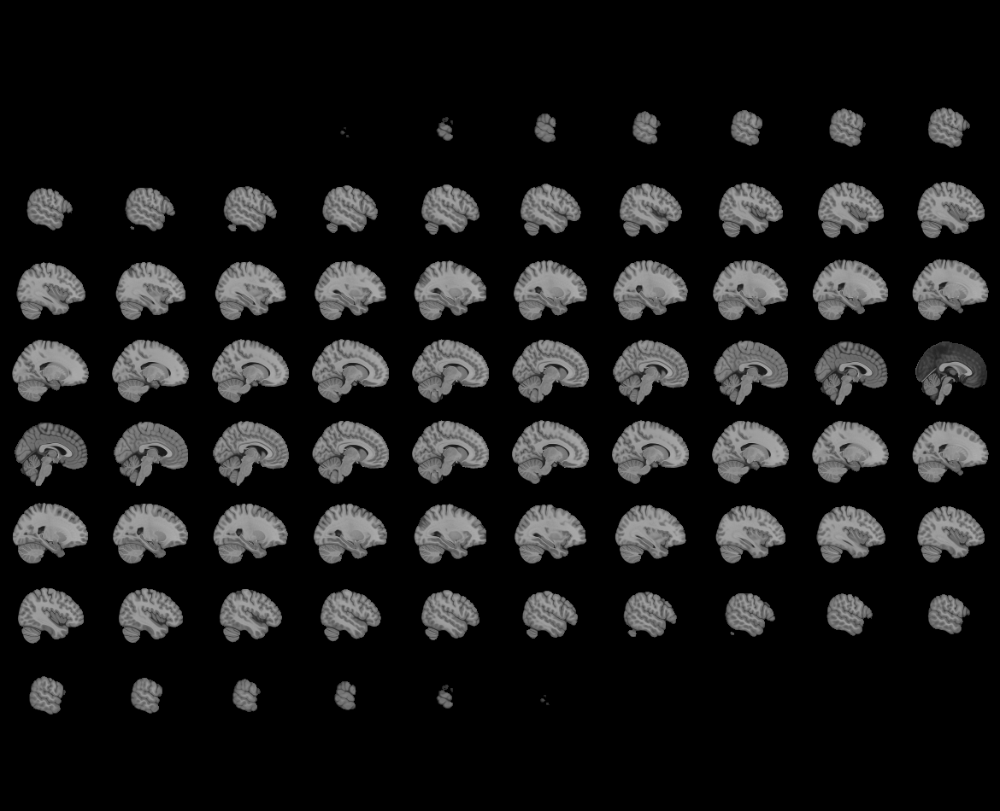
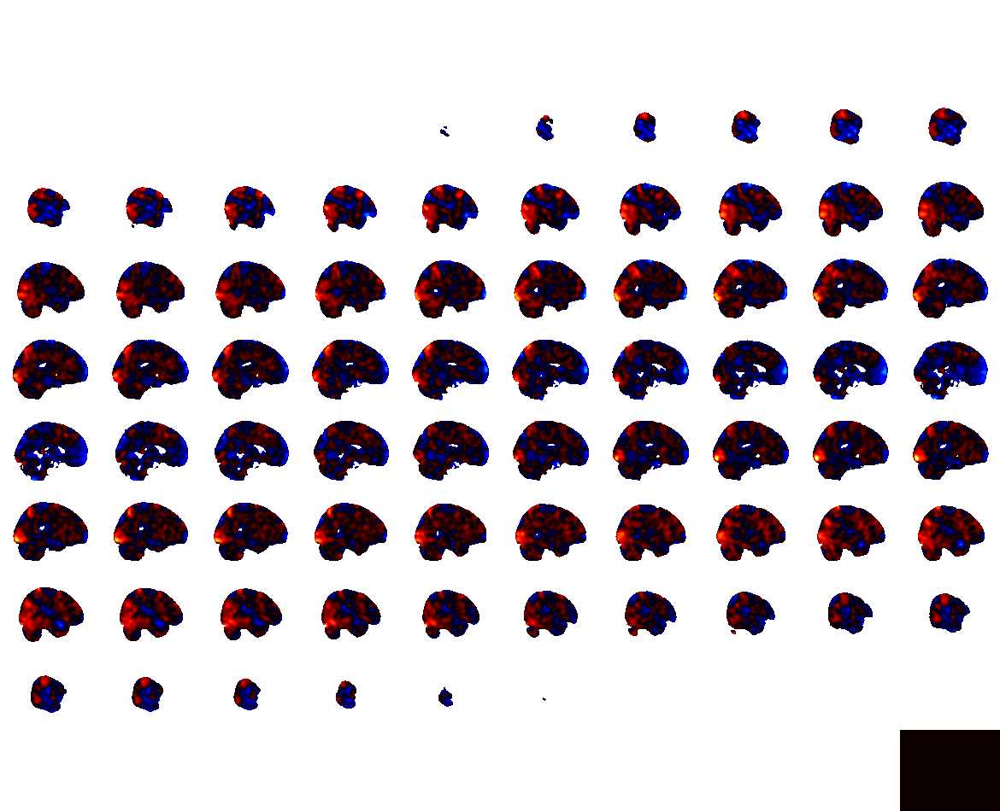

In [10]:
beta_filenames = os.listdir(dir)[1]
beta_filenames
file_path = os.path.join(dir, f"{beta_filenames}")
nii_data= nib.load(file_path)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(nii_data, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(nii_data.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{beta_filenames}", display_mode='ortho',cut_coords = [28, -68,-12])
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



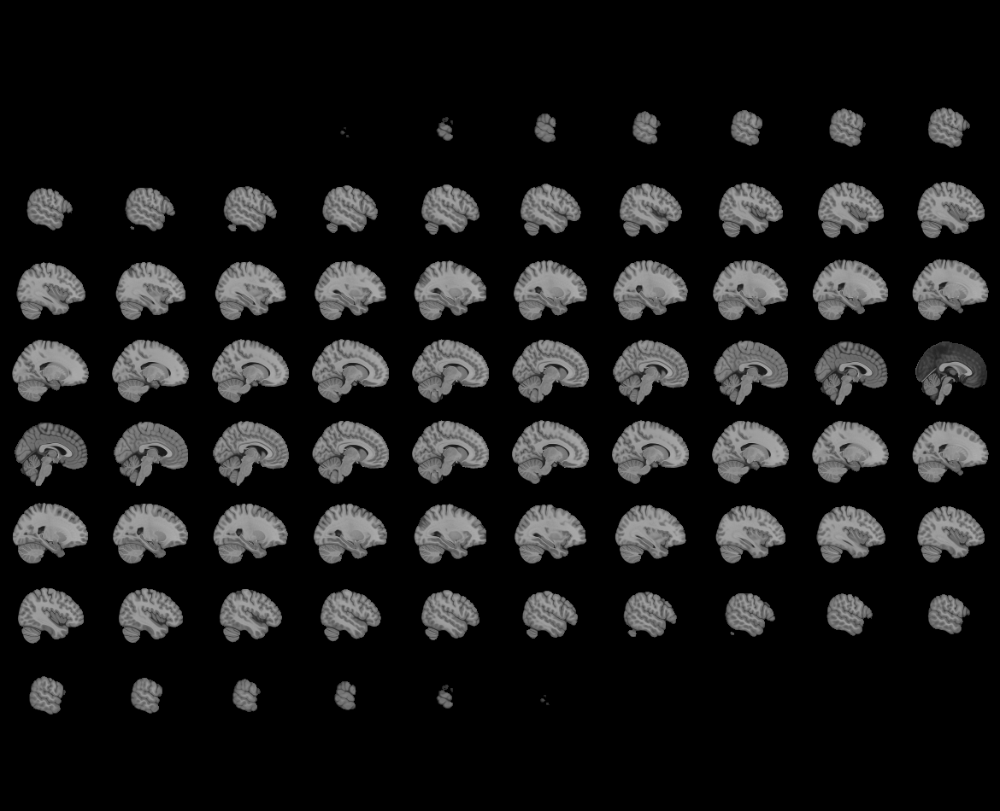
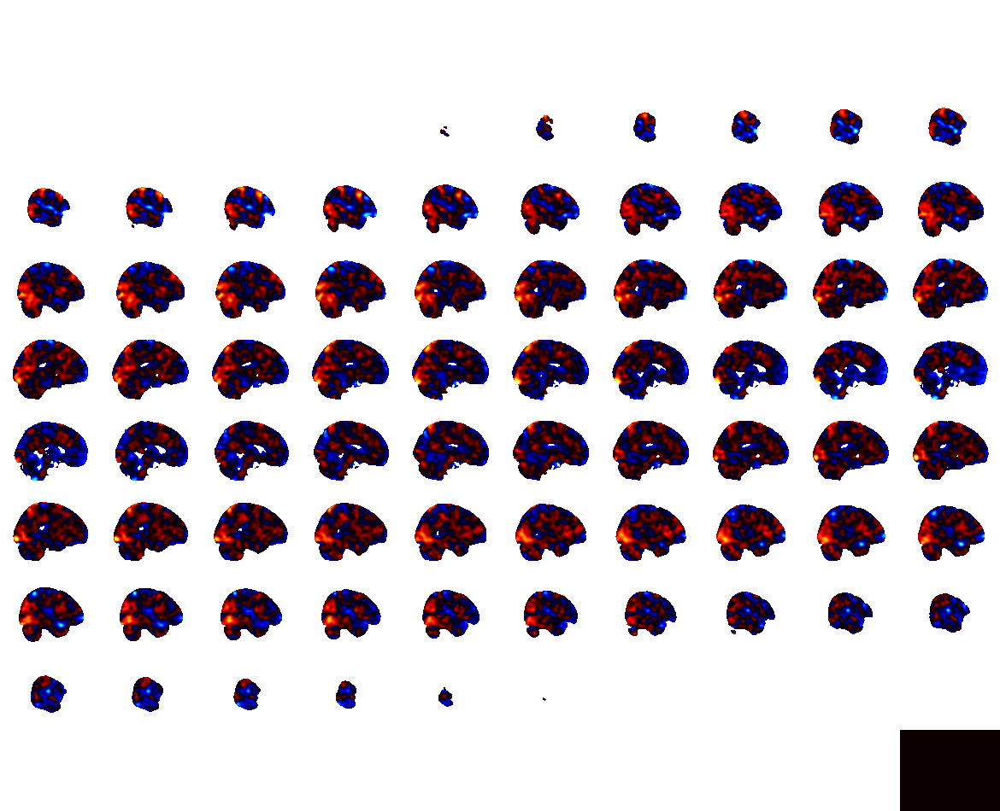

In [11]:
beta_filenames = os.listdir(dir)[2]
beta_filenames
file_path = os.path.join(dir, f"{beta_filenames}")
nii_data= nib.load(file_path)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(nii_data, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(nii_data.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{beta_filenames}", display_mode='ortho',cut_coords = [28, -68,-12])
view

# Contrast PL-NT, UP-NY in single subject

In [20]:
stimuli = pd.read_csv("./stimuli_600trials.csv")

In [21]:
stimuli

,Unnamed: 0,OriginalOrder,img,emotion_type,AI,group
0,0,0,2045_2.jpg,pleasant,YES,pleasantAI
1,1,1,6211_0.jpg,unpleasant,YES,unpleasantAI
2,2,2,5395_2.jpg,neutral,YES,neutralAI
3,3,3,3230_0.jpg,unpleasant,YES,unpleasantAI
4,4,4,2550.jpg,pleasant,NO,pleasant
...,...,...,...,...,...,...
595,595,595,3016_1.jpg,unpleasant,YES,unpleasantAI
596,596,596,9140.jpg,unpleasant,NO,unpleasant
597,597,597,2446.jpg,neutral,NO,neutral
598,598,598,9570_1.jpg,unpleasant,YES,unpleasantAI


### sub4

PL-NT

In [113]:
z_series_sub = np.load("./data/z_series_arr_sub4.npy")

In [116]:
beta_series_sub = np.load("./data/beta_series_sub4.npy")

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



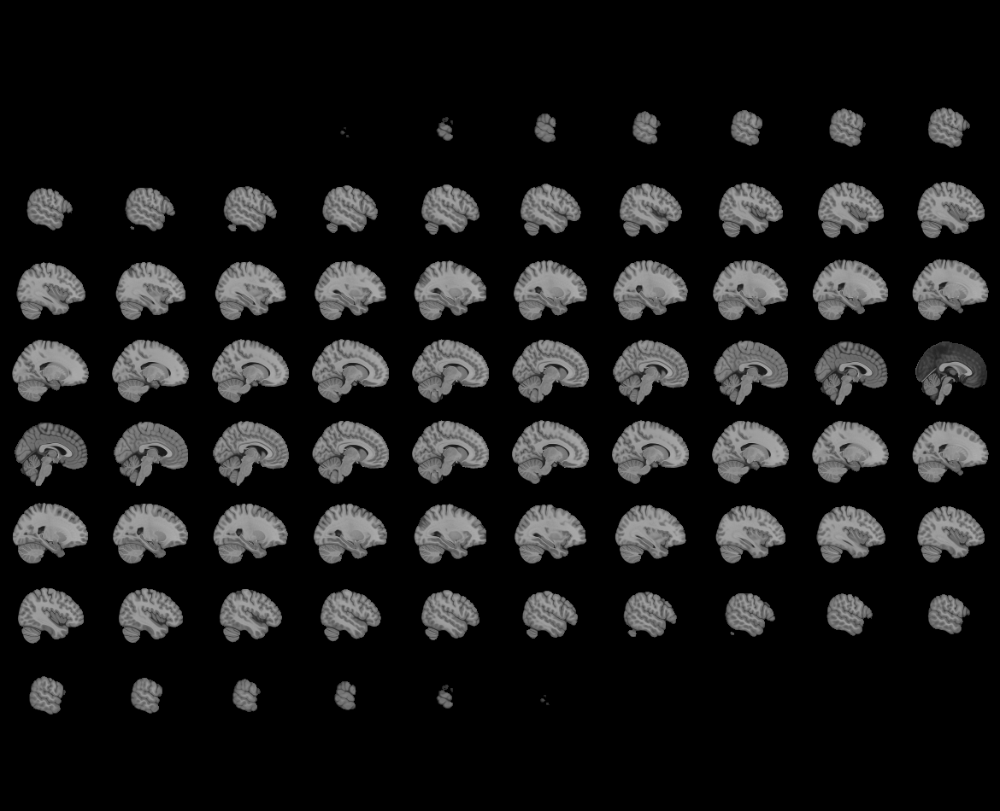
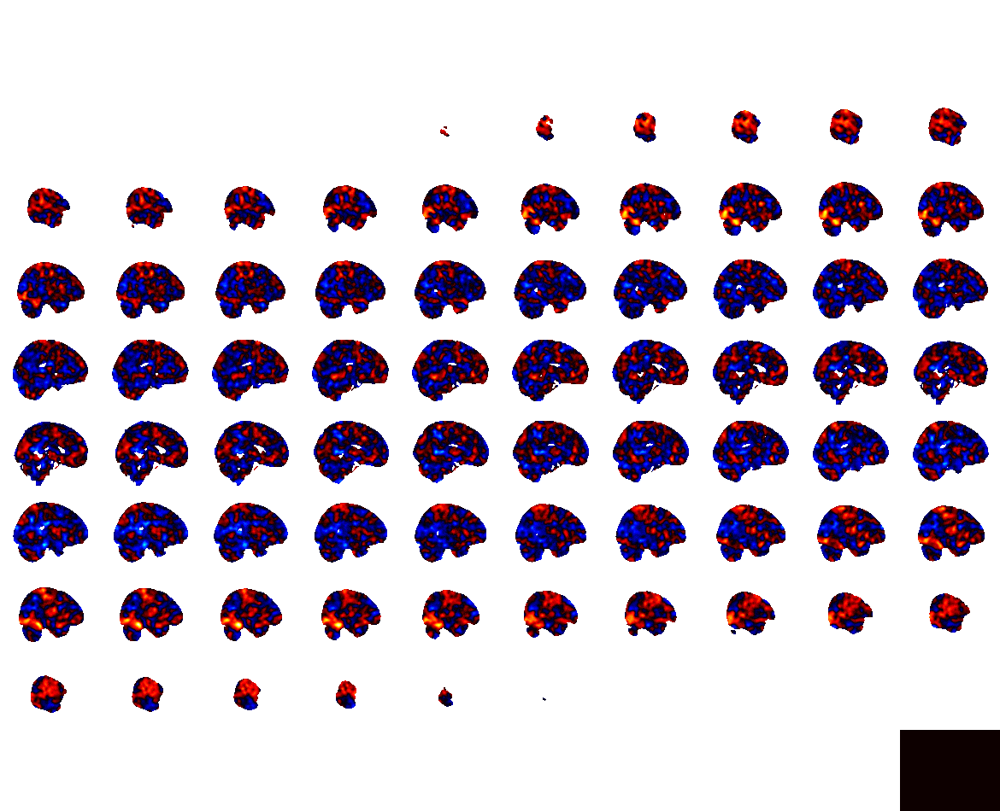

In [114]:

# Step 3: Reorder z_series_sub7 based on sorted group information
groups = ['pleasant', 'neutral', 'unpleasant', 'pleasantAI', 'neutralAI', 'unpleasantAI']
reordered_z_series_sub = np.empty_like(z_series_sub)  # Create an empty array of the same shape

reordered_index = 0
for group in groups:
    indices = stimuli.index[stimuli['group'] == group].tolist()
    for idx in indices:
        reordered_z_series_sub[reordered_index] = z_series_sub[idx]
        reordered_index += 1
# reordered_z_series_sub7 now contains the z_series_sub7 reordered based on group information
mean_z_series_sub_pl = reordered_z_series_sub[0:100]
mean_z_series_sub_nt = reordered_z_series_sub[100:200]
mean_z_series_sub_up = reordered_z_series_sub[200:300]
mean_z_series_sub_plai = reordered_z_series_sub[300:400]
mean_z_series_sub_ntai = reordered_z_series_sub[400:500]
mean_z_series_sub_upai = reordered_z_series_sub[500:600]
mean_z_series_sub_pl_mean = np.mean(mean_z_series_sub_pl, axis=0)
mean_z_series_sub_nt_mean = np.mean(mean_z_series_sub_nt, axis=0)
mean_z_series_sub_up_mean = np.mean(mean_z_series_sub_up, axis=0)
mean_z_series_sub_plai_mean = np.mean(mean_z_series_sub_plai, axis=0)
mean_z_series_sub_ntai_mean = np.mean(mean_z_series_sub_ntai, axis=0)
mean_z_series_sub_upai_mean = np.mean(mean_z_series_sub_upai, axis=0)

con_3d = mean_z_series_sub_pl_mean - mean_z_series_sub_nt_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", thrshold = 0.5, display_mode='ortho')
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



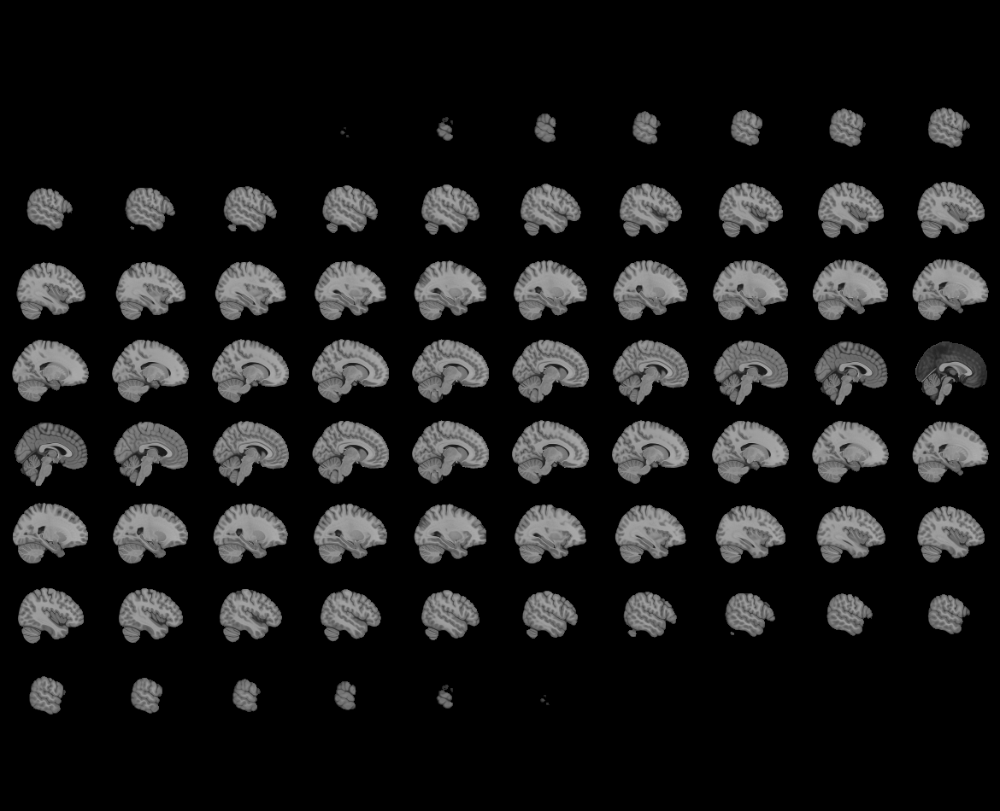
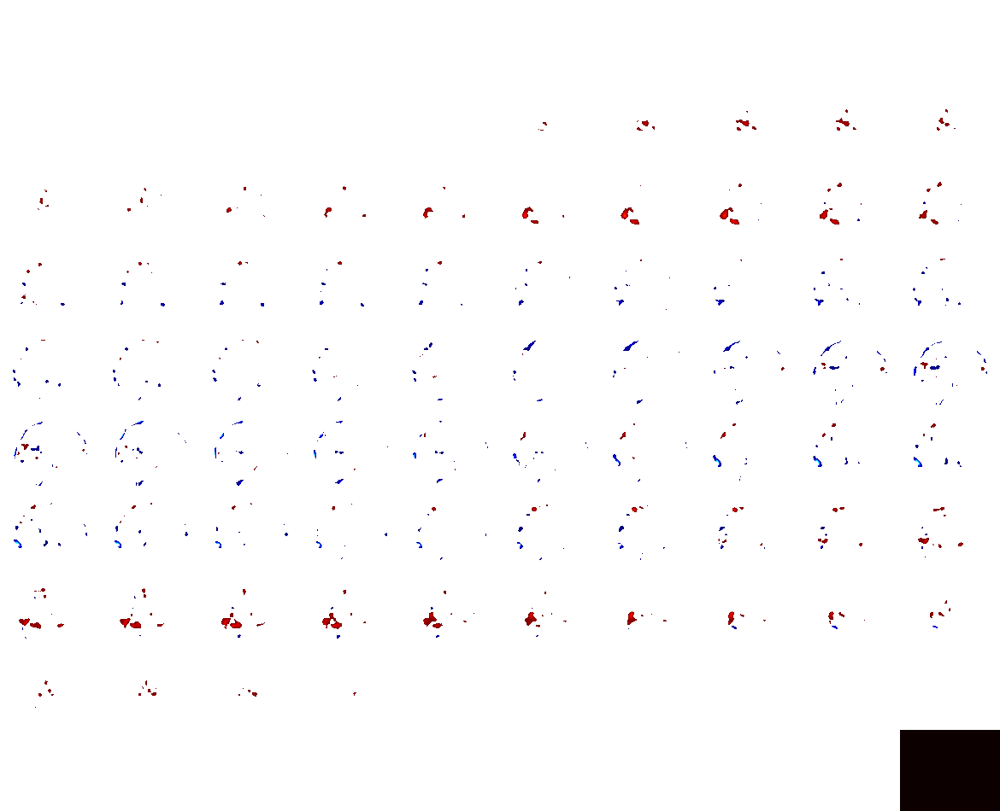

In [118]:

# Step 3: Reorder z_series_sub7 based on sorted group information
groups = ['pleasant', 'neutral', 'unpleasant', 'pleasantAI', 'neutralAI', 'unpleasantAI']
reordered_z_series_sub = np.empty_like(beta_series_sub)  # Create an empty array of the same shape

reordered_index = 0
for group in groups:
    indices = stimuli.index[stimuli['group'] == group].tolist()
    for idx in indices:
        reordered_z_series_sub[reordered_index] = beta_series_sub[idx]
        reordered_index += 1
# reordered_z_series_sub7 now contains the z_series_sub7 reordered based on group information
mean_z_series_sub_pl = reordered_z_series_sub[0:100]
mean_z_series_sub_nt = reordered_z_series_sub[100:200]
mean_z_series_sub_up = reordered_z_series_sub[200:300]
mean_z_series_sub_plai = reordered_z_series_sub[300:400]
mean_z_series_sub_ntai = reordered_z_series_sub[400:500]
mean_z_series_sub_upai = reordered_z_series_sub[500:600]
mean_z_series_sub_pl_mean = np.mean(mean_z_series_sub_pl, axis=0)
mean_z_series_sub_nt_mean = np.mean(mean_z_series_sub_nt, axis=0)
mean_z_series_sub_up_mean = np.mean(mean_z_series_sub_up, axis=0)
mean_z_series_sub_plai_mean = np.mean(mean_z_series_sub_plai, axis=0)
mean_z_series_sub_ntai_mean = np.mean(mean_z_series_sub_ntai, axis=0)
mean_z_series_sub_upai_mean = np.mean(mean_z_series_sub_upai, axis=0)

con_3d = mean_z_series_sub_pl_mean - mean_z_series_sub_nt_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", threshold = 1, display_mode='ortho')
view

UP-NT

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



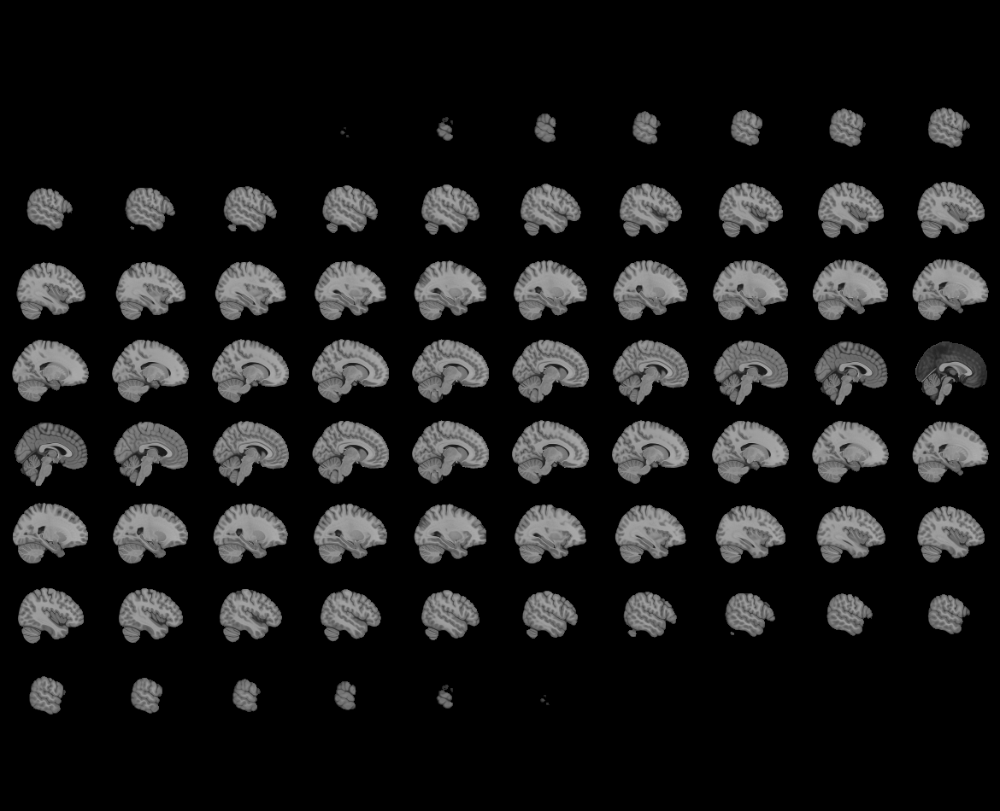
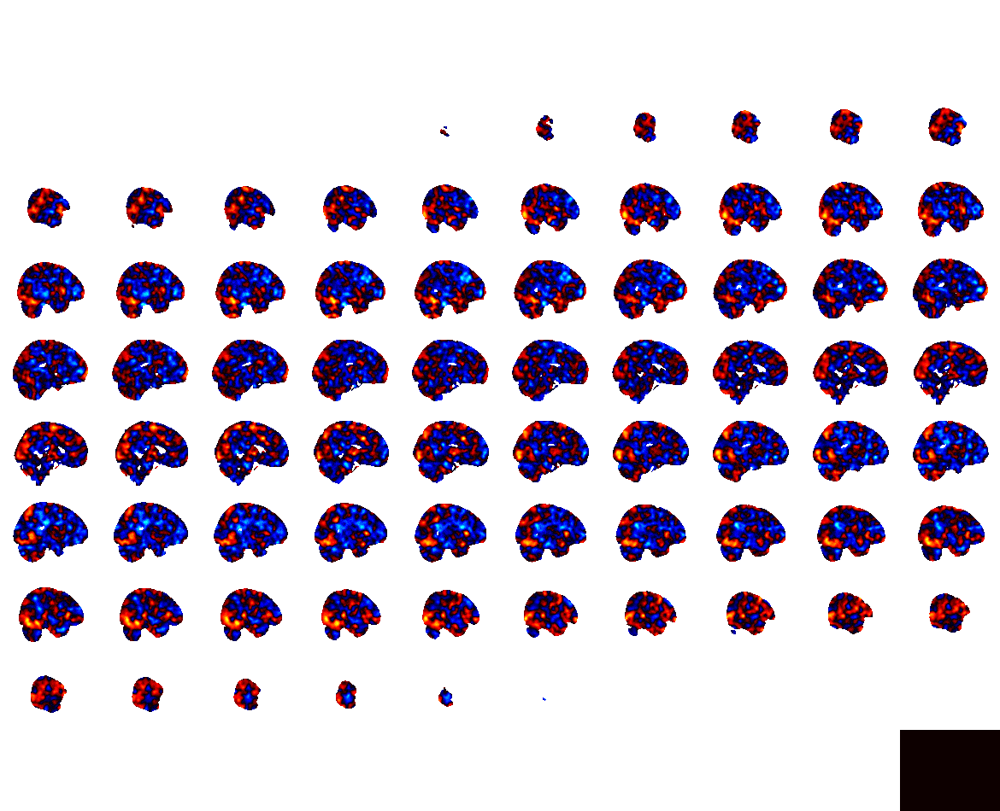

In [103]:
con_3d = mean_z_series_sub_up_mean - mean_z_series_sub_nt_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", thrshold = 1, display_mode='ortho')
view

PLAI-NTAI

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



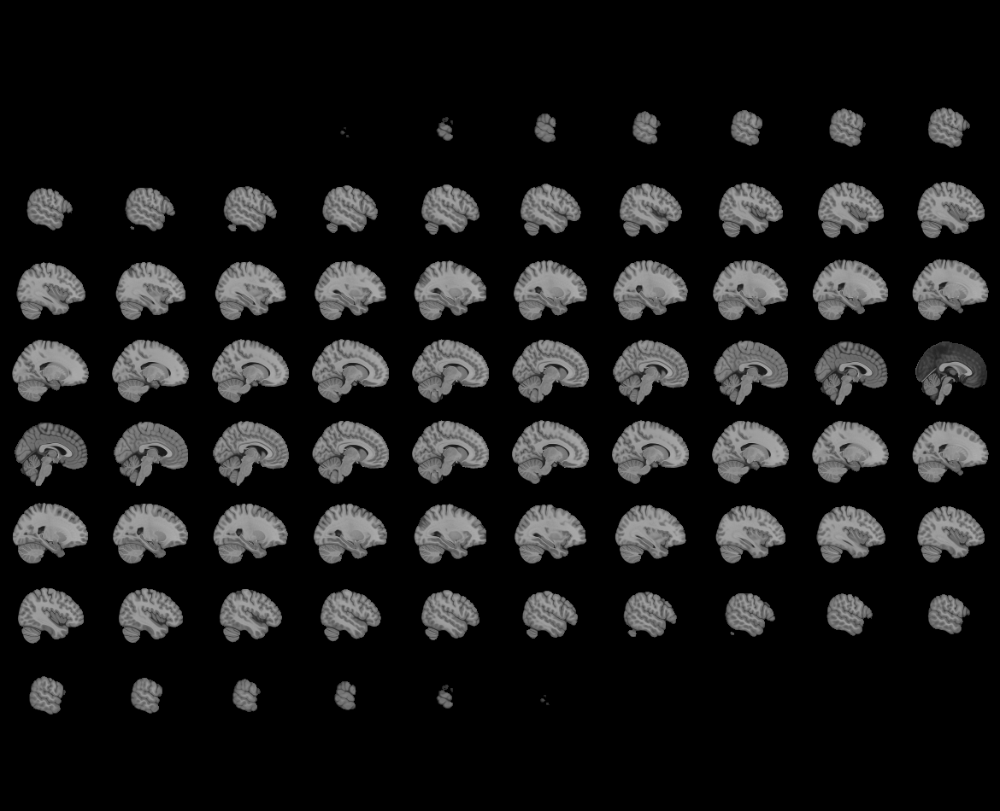
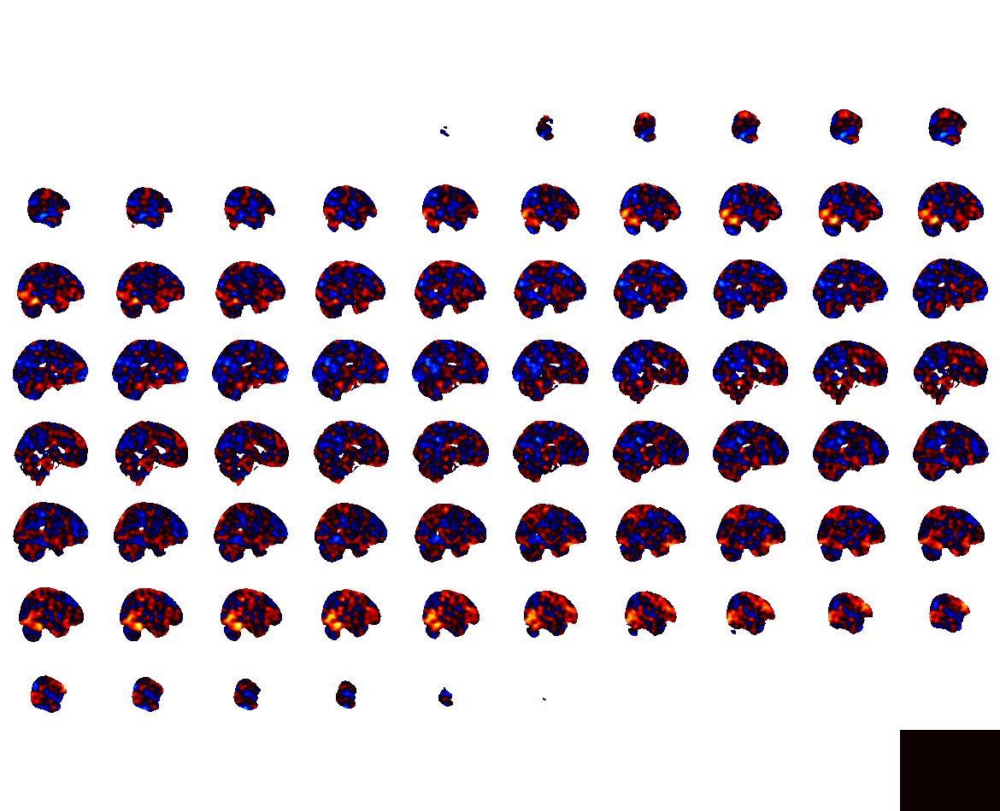

In [104]:
con_3d = mean_z_series_sub_plai_mean - mean_z_series_sub_ntai_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", thrshold = 1, display_mode='ortho')
view

UPAI-NTAI

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



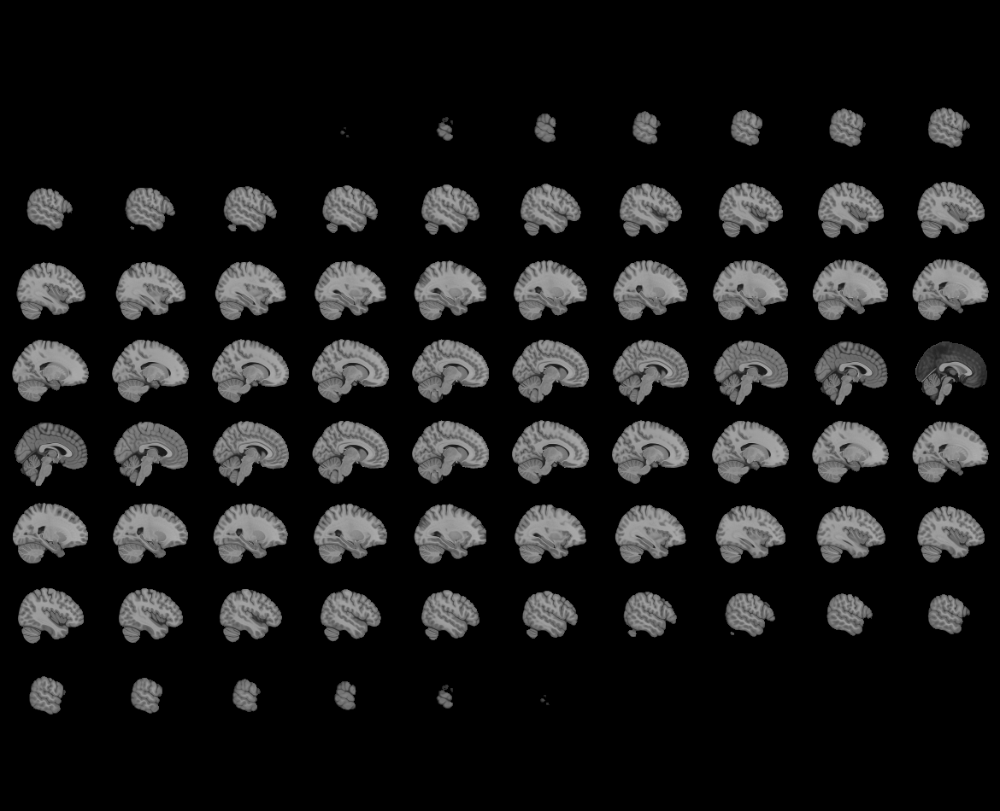
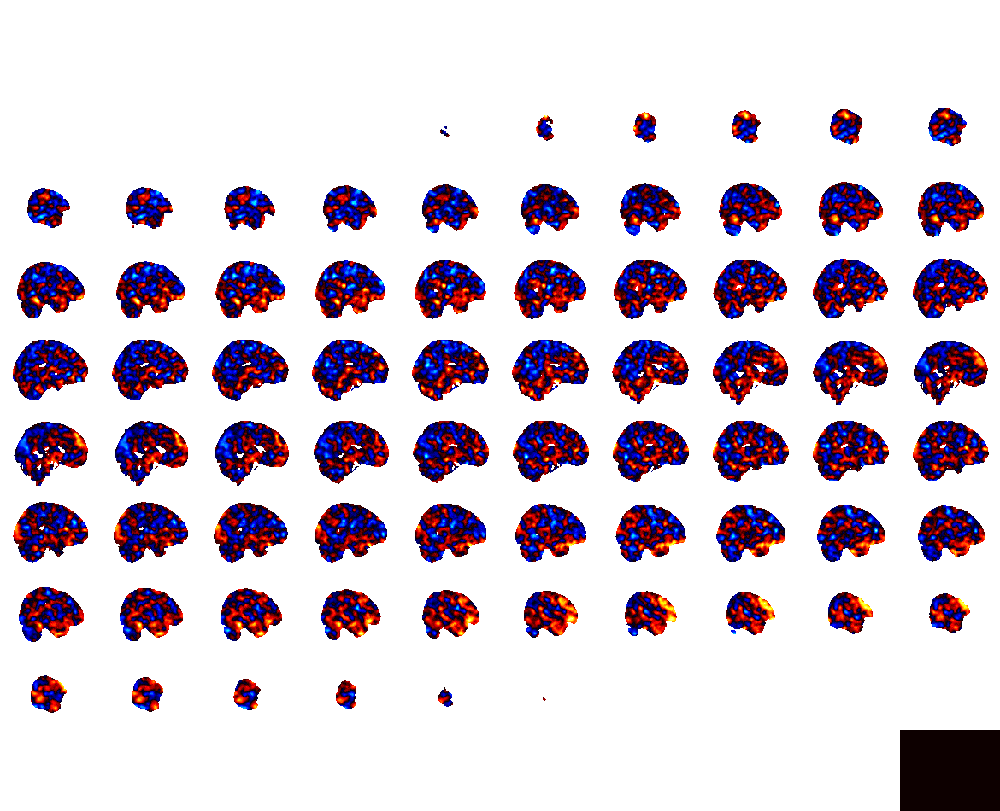

In [105]:
con_3d = mean_z_series_sub_upai_mean - mean_z_series_sub_ntai_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", thrshold = 1, display_mode='ortho')
view

### Sub 5

In [106]:
z_series_sub=np.nan

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



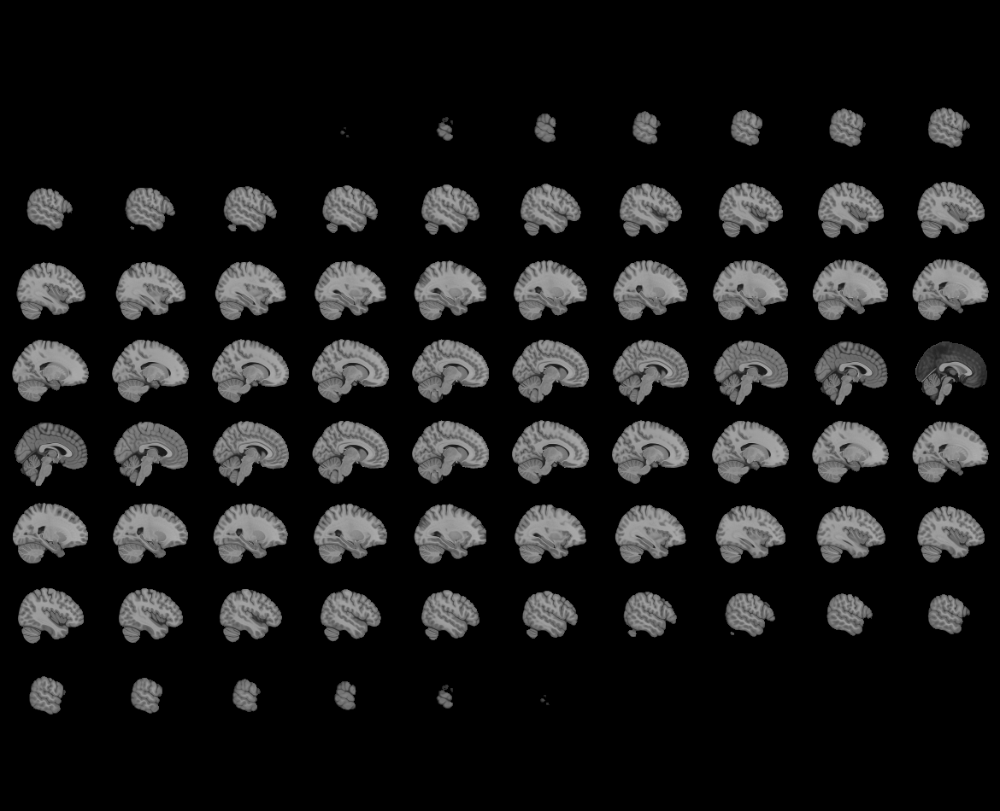
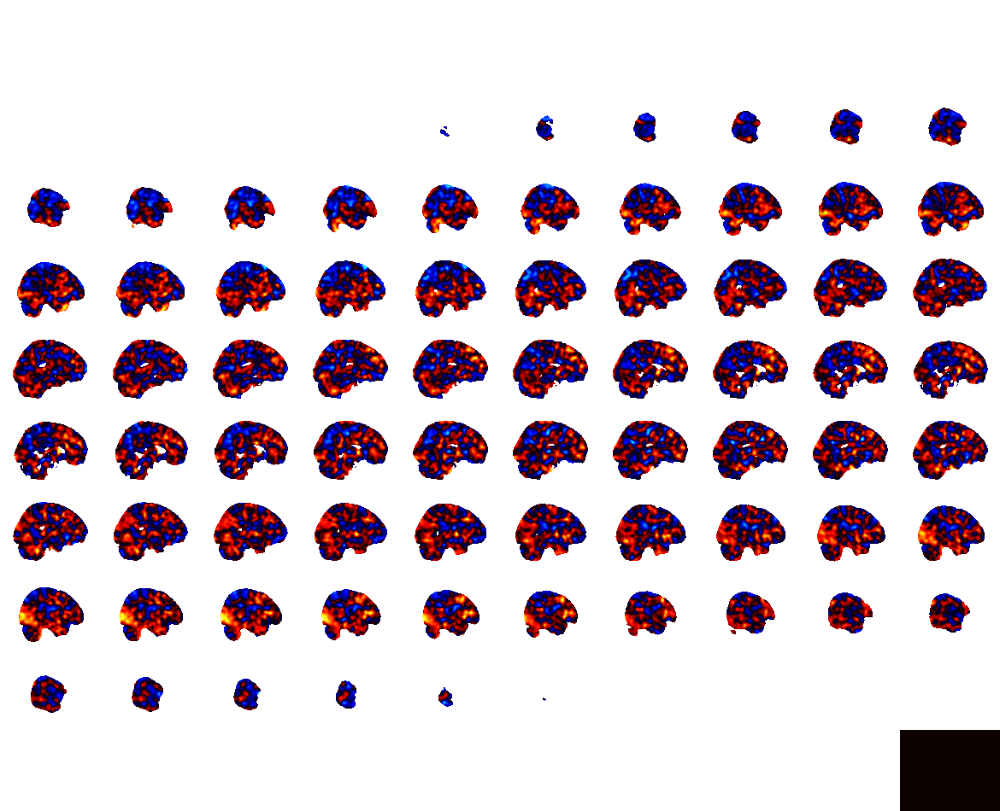

In [109]:
z_series_sub = np.load("./data/z_series_arr_sub5.npy")

# Step 3: Reorder z_series_sub7 based on sorted group information
groups = ['pleasant', 'neutral', 'unpleasant', 'pleasantAI', 'neutralAI', 'unpleasantAI']
reordered_z_series_sub = np.empty_like(z_series_sub)  # Create an empty array of the same shape

reordered_index = 0
for group in groups:
    indices = stimuli.index[stimuli['group'] == group].tolist()
    for idx in indices:
        reordered_z_series_sub[reordered_index] = z_series_sub[idx]
        reordered_index += 1
# reordered_z_series_sub7 now contains the z_series_sub7 reordered based on group information
mean_z_series_sub_pl = reordered_z_series_sub[0:100]
mean_z_series_sub_nt = reordered_z_series_sub[100:200]
mean_z_series_sub_up = reordered_z_series_sub[200:300]
mean_z_series_sub_plai = reordered_z_series_sub[300:400]
mean_z_series_sub_ntai = reordered_z_series_sub[400:500]
mean_z_series_sub_upai = reordered_z_series_sub[500:600]
mean_z_series_sub_pl_mean = np.mean(mean_z_series_sub_pl, axis=0)
mean_z_series_sub_nt_mean = np.mean(mean_z_series_sub_nt, axis=0)
mean_z_series_sub_up_mean = np.mean(mean_z_series_sub_up, axis=0)
mean_z_series_sub_plai_mean = np.mean(mean_z_series_sub_plai, axis=0)
mean_z_series_sub_ntai_mean = np.mean(mean_z_series_sub_ntai, axis=0)
mean_z_series_sub_upai_mean = np.mean(mean_z_series_sub_upai, axis=0)

con_3d = mean_z_series_sub_pl_mean - mean_z_series_sub_nt_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", thrshold = 1, display_mode='ortho')
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



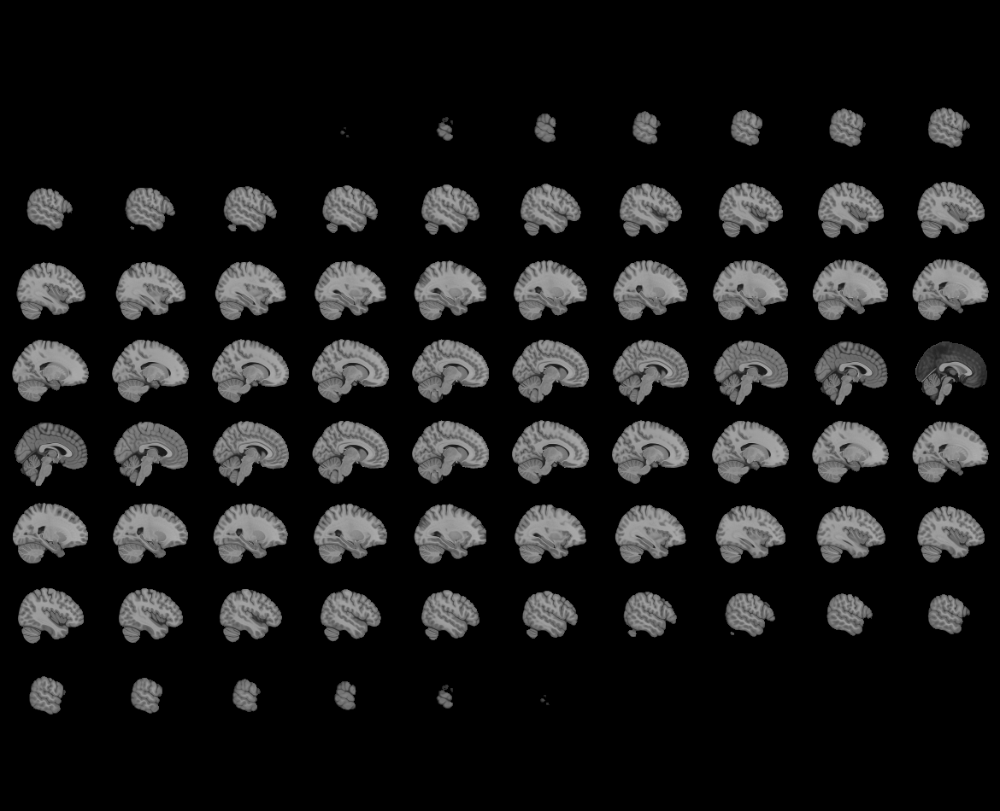
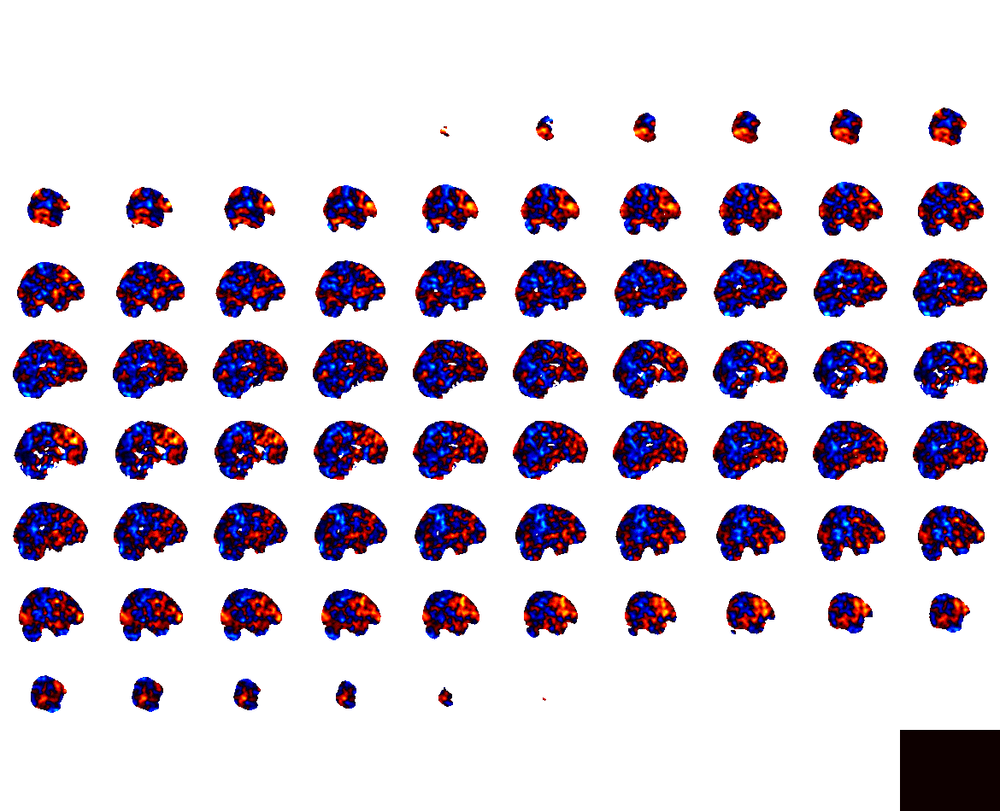

In [110]:
con_3d = mean_z_series_sub_up_mean - mean_z_series_sub_nt_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", thrshold = 1, display_mode='ortho')
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



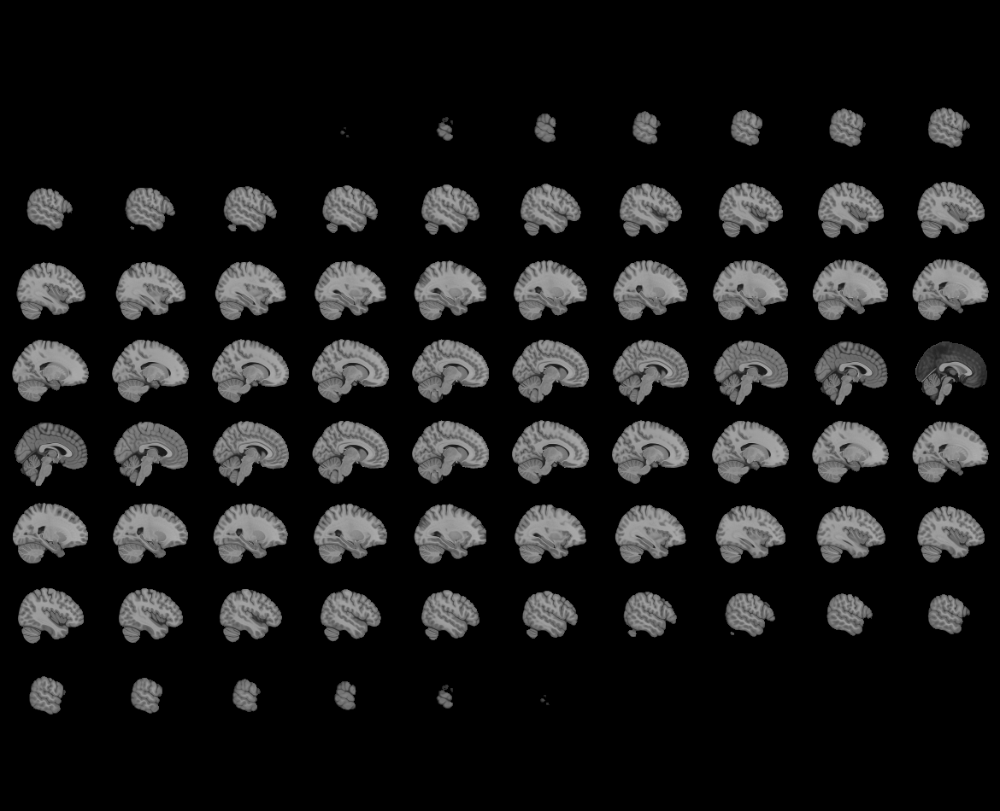
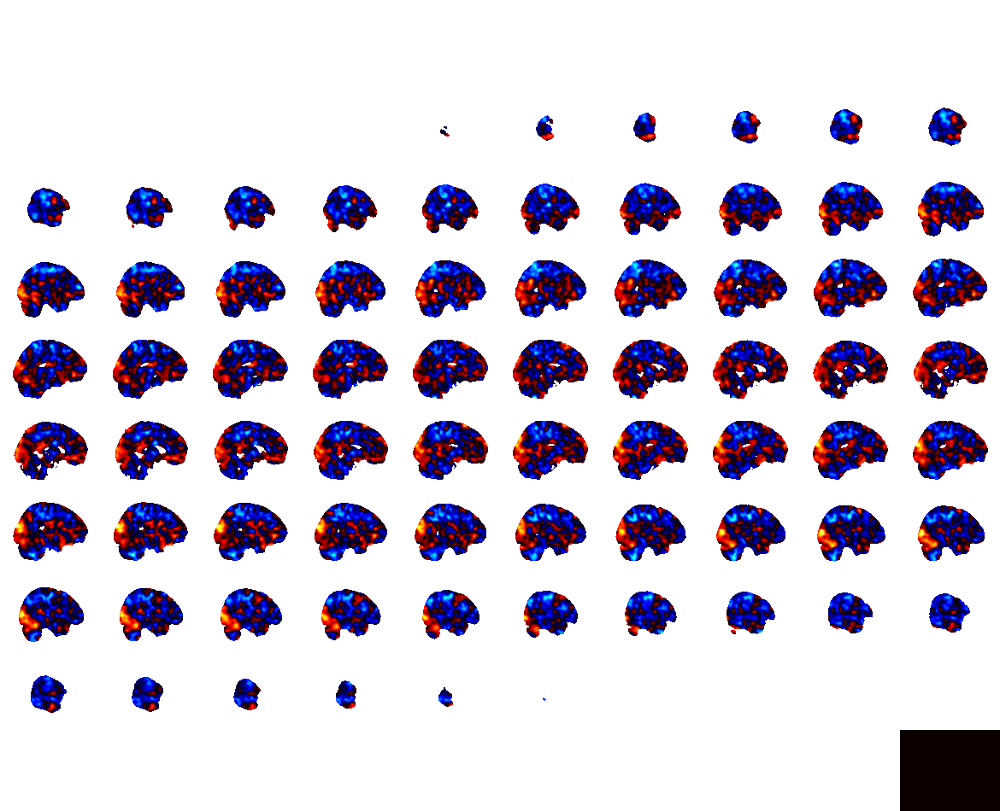

In [111]:
con_3d = mean_z_series_sub_plai_mean - mean_z_series_sub_ntai_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", thrshold = 1, display_mode='ortho')
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



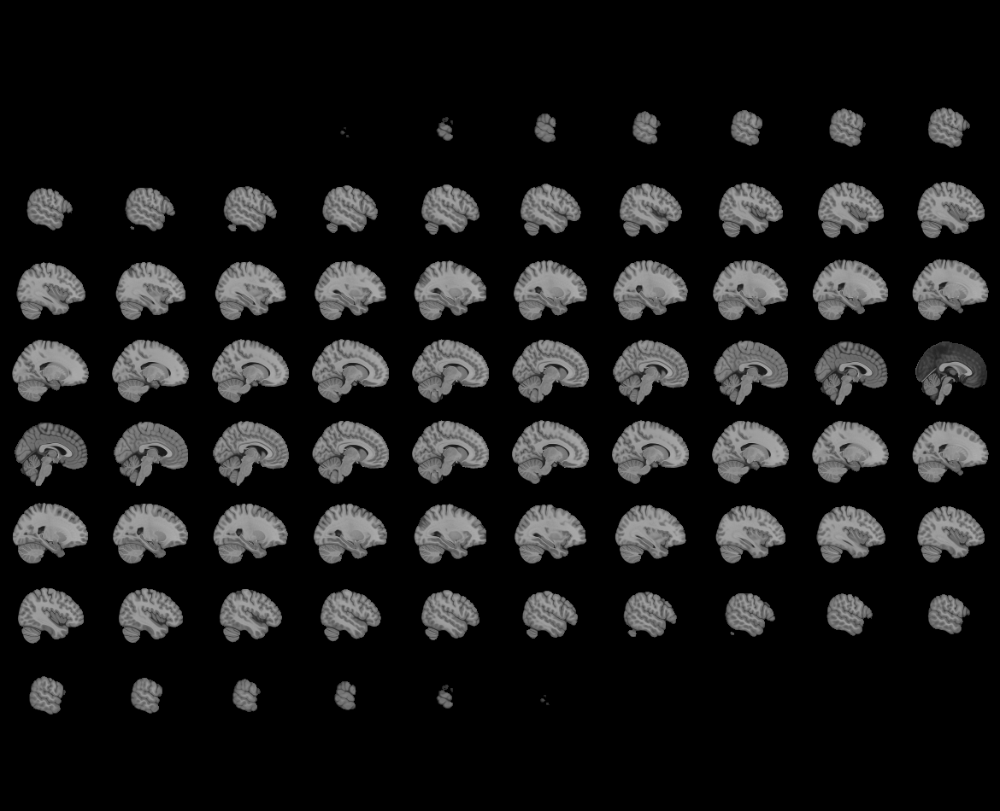
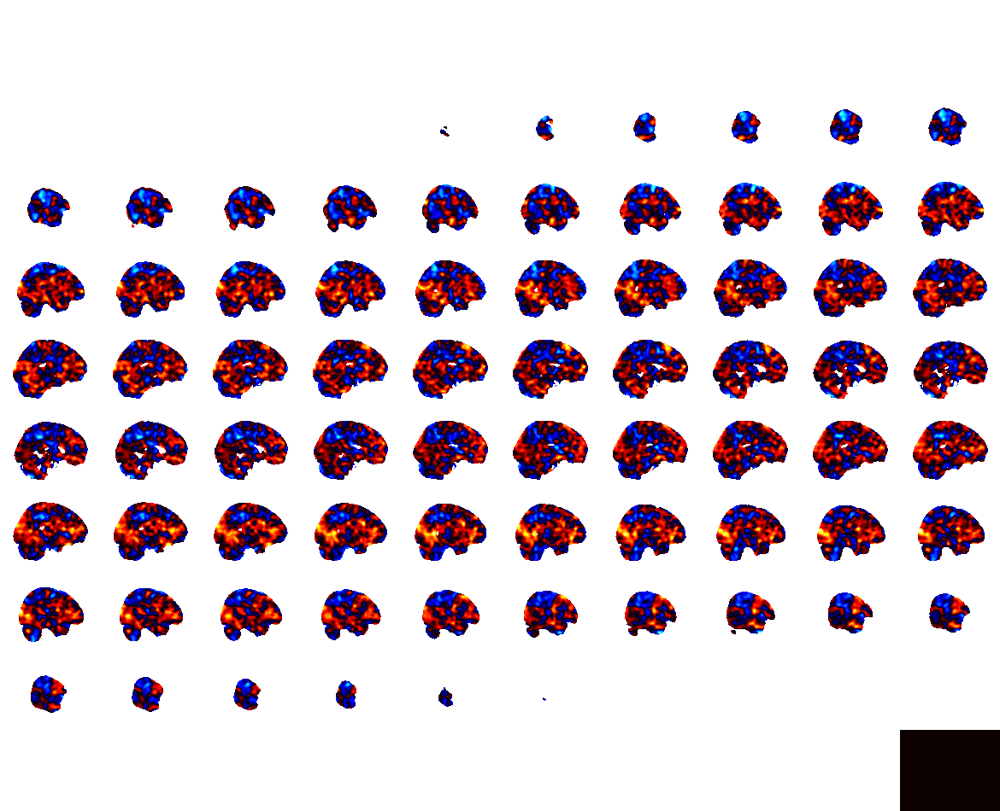

In [112]:
con_3d = mean_z_series_sub_upai_mean - mean_z_series_sub_ntai_mean

beta_nii = new_img_like(temp_nii_data, con_3d)
# Apply the mask to the NIfTI image
masked_data = masking.apply_mask(beta_nii, resampled_mask)
# Get the mask's indices in the original 3D shape
mask_indices = np.where(resampled_mask.get_fdata())
# Create a new 3D array filled with zeros
reshaped_data = np.zeros(beta_nii.shape)
# Fill the new 3D array with the values from the masked data
reshaped_data[mask_indices] = masked_data
beta_nii = new_img_like(temp_nii_data, reshaped_data)
view = plotting.view_img(beta_nii, title = f"{i+1}", thrshold = 1, display_mode='ortho')
view